In [1]:
import numpy as np
import matplotlib.pyplot as plt

# interpolate log

In [5]:
def interpolating_log(x, a):
    
    #return(y_0 + (x**a - x_0**a)/(x_1**a - x_0**a) * (y_1 - y_0))
    return((a)*x + (1-a)*np.log(x))

In [10]:
x_ = np.linspace(0.01, 10, 1000+1)

y_a1 = interpolating_log(x_, a=1)
y_a78 = interpolating_log(x_, a=7/8)
y_a34 = interpolating_log(x_, a=3/4)
y_a12 = interpolating_log(x_, a=1/2)
y_a14 = interpolating_log(x_, a=1/4)
y_a18 = interpolating_log(x_, a=1/8)
y_a0 = interpolating_log(x_, a=0.001)

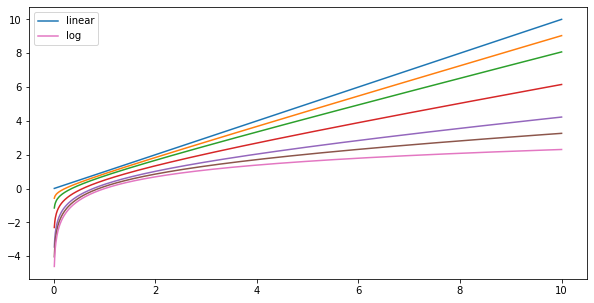

In [12]:
plt.figure(figsize=(10, 5))

plt.plot(x_, y_a1, label='linear')
plt.plot(x_, y_a78)
plt.plot(x_, y_a34)
plt.plot(x_, y_a12)
plt.plot(x_, y_a14)
plt.plot(x_, y_a18)
plt.plot(x_, y_a0, label='log')
plt.legend()
plt.show();

# interpolate exp

In [14]:
# just use a convex combination of the two functions

def interpolating_exp(x, a): 
    
    return((1-a)*x+ a*np.exp(x))

In [15]:
x_ = np.linspace(0.001, 2, 1000+1)

y_exp_a1 = interpolating_exp(x_, a=1)
y_exp_a78 = interpolating_exp(x_, a=7/8)
y_exp_a34 = interpolating_exp(x_, a=3/4)
y_exp_a12 = interpolating_exp(x_, a=1/2)
y_exp_a14 = interpolating_exp(x_, a=1/4)
y_exp_a18 = interpolating_exp(x_, a=1/8)
y_exp_a0 = interpolating_exp(x_, a=0.001)

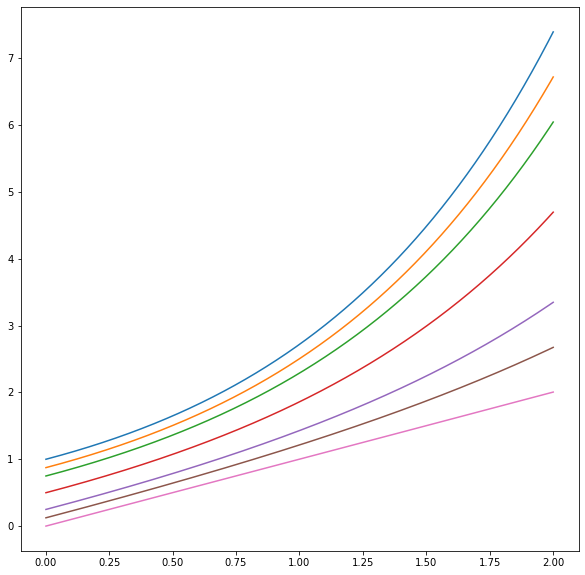

In [16]:
plt.figure(figsize=(10, 10))

plt.plot(x_, y_exp_a1)
plt.plot(x_, y_exp_a78)
plt.plot(x_, y_exp_a34)
plt.plot(x_, y_exp_a12)
plt.plot(x_, y_exp_a14)
plt.plot(x_, y_exp_a18)
plt.plot(x_, y_exp_a0)
plt.show();

In [17]:
# test cases for interpolating exp

print(interpolating_exp(1, a=1))
print(interpolating_exp(0, a=1))
print(interpolating_exp(1, a=0))
print(interpolating_exp(0, a=0))

2.718281828459045
1.0
1.0
0.0


# interpolating the Gamma

In [18]:
from scipy.special import gamma as gamma_func

def gamma_pdf(x, a, l):
    r = l**a/gamma_func(a) * (x ** (a-1)) * (np.exp(-x*l))
    return(r)

def gamma_pdf_t_log(x, a, l):
    c = gamma_func(a) /l**a
    r = 1/c * (np.exp(x) ** a) * (np.exp(-np.exp(x) * l))
    return(r)

def gamma_pdf_interpolating_log(x, a, l, d):
    c1 = gamma_func(a) /l**a
    c2 = l**a/gamma_func(a)
    c = (1-d)*c1 + d*c2
    r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
    return(r)

1.5
1.25
1.125
1.75
1.875


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


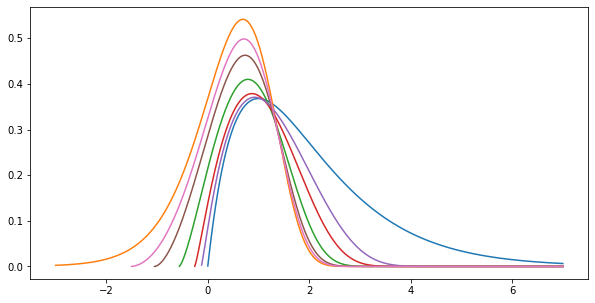

In [19]:
x_P = np.linspace(0.001, 7, 1000+1)
x_R = np.linspace(-3, 7, 1000+1)
x_R12 = np.linspace(-1.2, 7, 1000+1)
x_R14 = np.linspace(-1, 7, 1000+1)
x_R18 = np.linspace(-1, 7, 1000+1)
x_R34 = np.linspace(-1.5, 7, 1000+1)
x_R78 = np.linspace(-1.5, 7, 1000+1)

a1, l1 = 2, 1
gamma1_pdf = gamma_pdf(x_P, a1, l1)
gamma1_pdf_log = gamma_pdf_t_log(x_R, a1, l1)
gamma1_pdf_log_12 = gamma_pdf_interpolating_log(x_R12, a1, l1, d=1/2)
gamma1_pdf_log_14 = gamma_pdf_interpolating_log(x_R14, a1, l1, d=1/4)
gamma1_pdf_log_18 = gamma_pdf_interpolating_log(x_R18, a1, l1, d=1/8)
gamma1_pdf_log_34 = gamma_pdf_interpolating_log(x_R34, a1, l1, d=3/4)
gamma1_pdf_log_78 = gamma_pdf_interpolating_log(x_R78, a1, l1, d=7/8)

plt.figure(figsize=(10, 5))

plt.plot(x_P, gamma1_pdf)
plt.plot(x_R, gamma1_pdf_log)
plt.plot(x_R12, gamma1_pdf_log_12)
plt.plot(x_R14, gamma1_pdf_log_14)
plt.plot(x_R18, gamma1_pdf_log_18)
plt.plot(x_R34, gamma1_pdf_log_34)
plt.plot(x_R78, gamma1_pdf_log_78)
plt.show();

## interpolate for real now

1.00001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


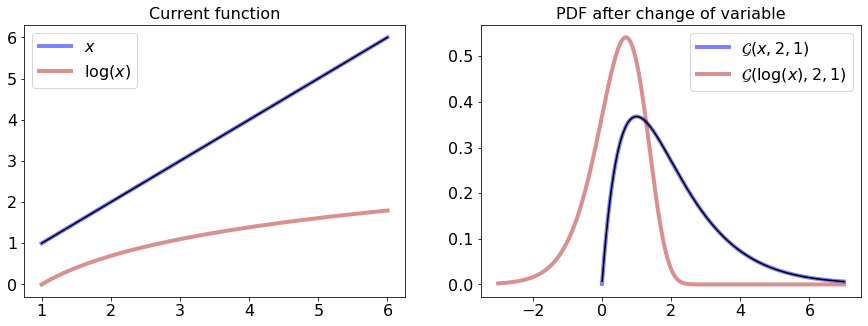

1.0100098


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


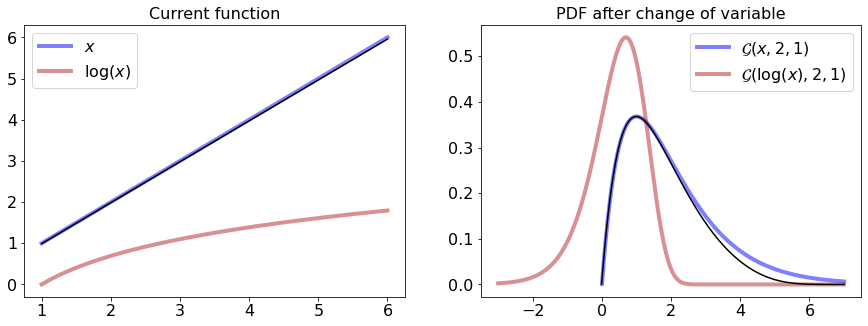

1.0200096


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


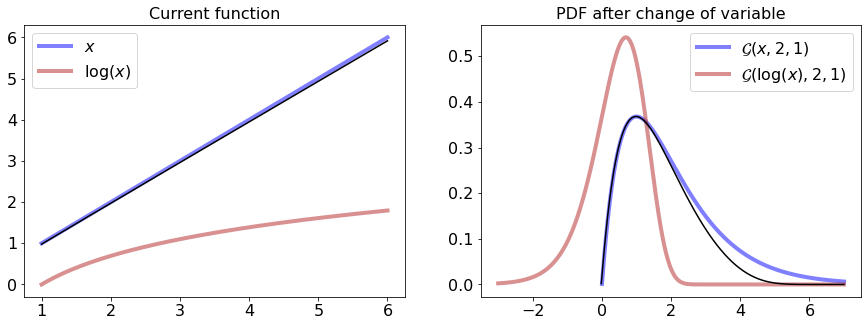

1.0300094


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


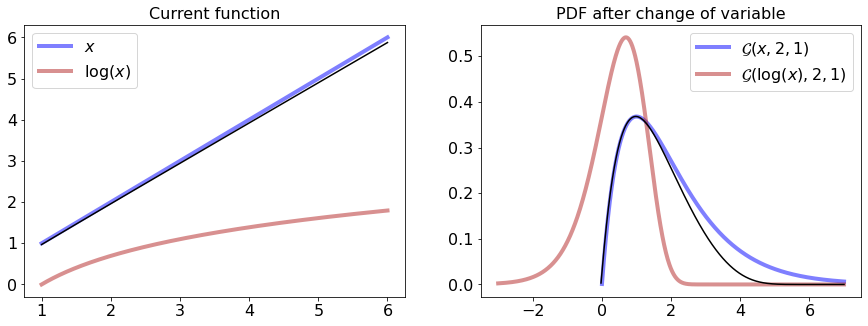

1.0400092


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


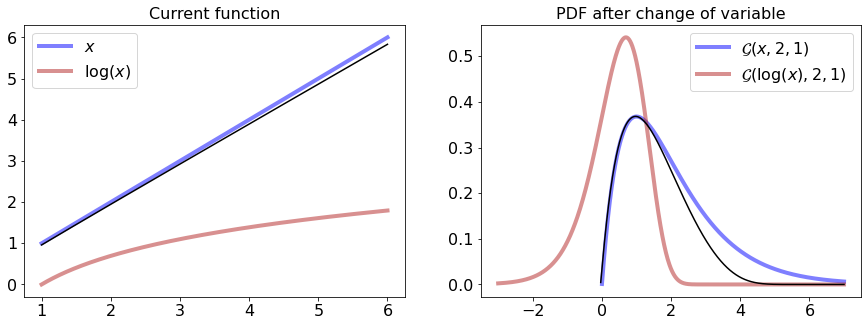

1.050009


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


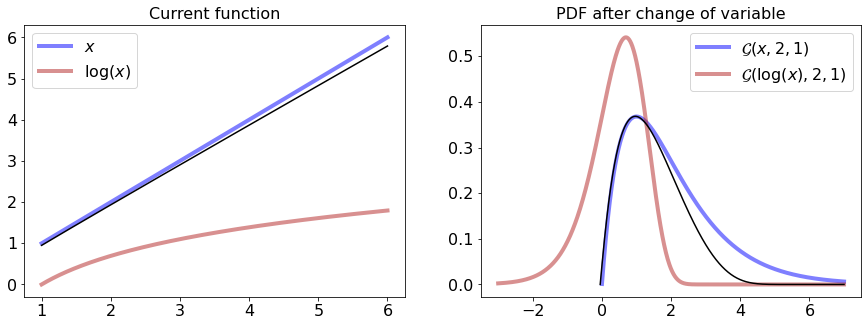

1.0600088


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


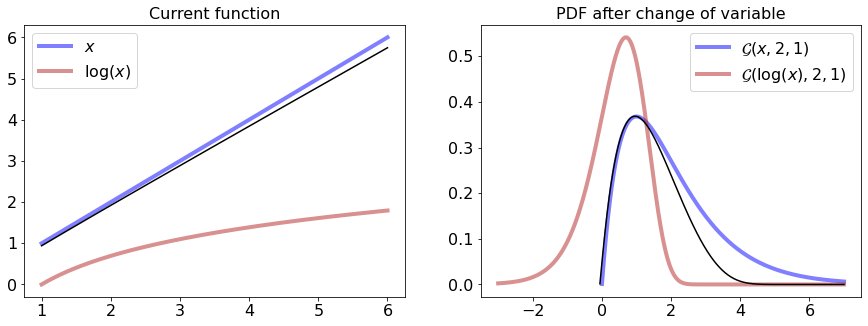

1.0700086


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


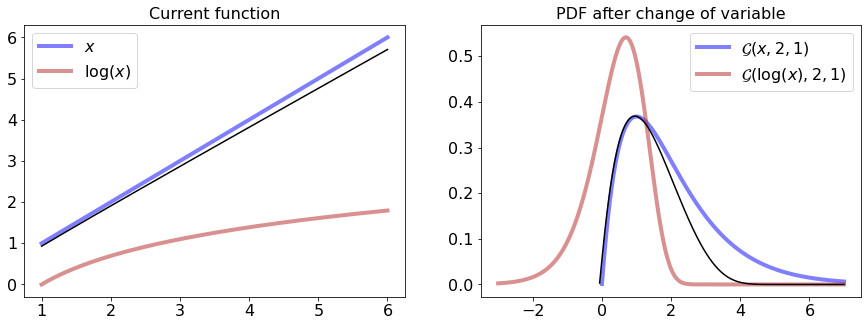

1.0800084


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


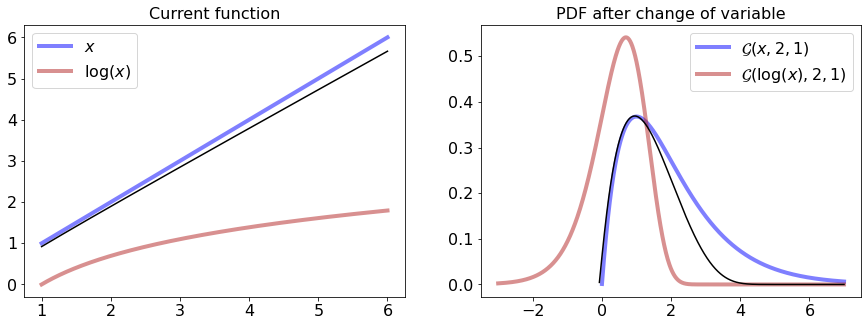

1.0900082


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


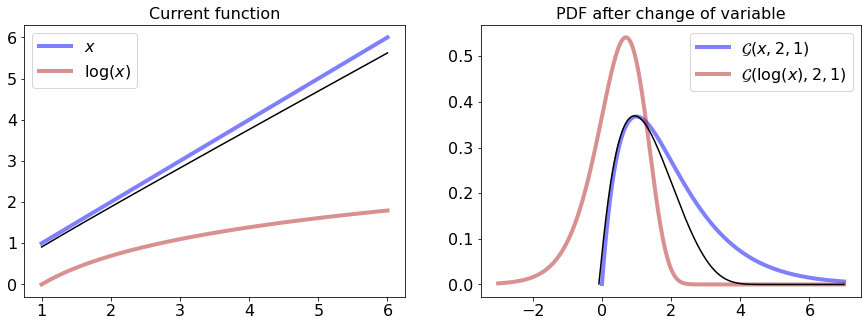

1.100008


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


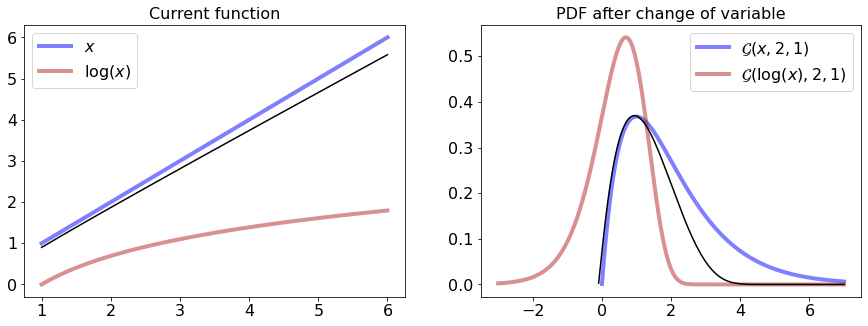

1.1100078


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


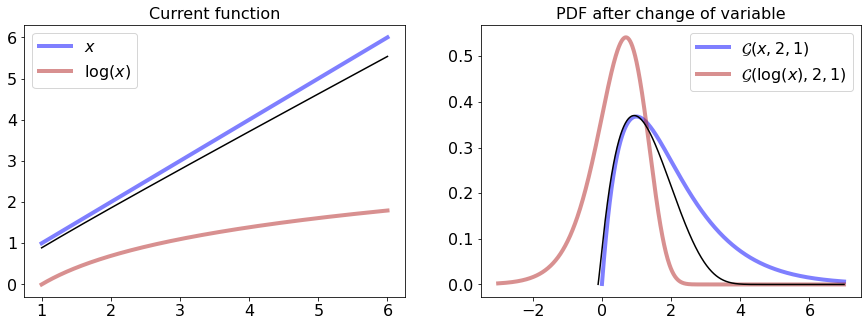

1.1200076


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


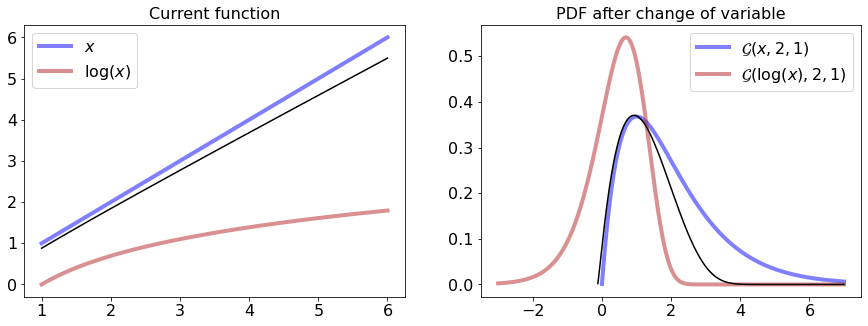

<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1300074


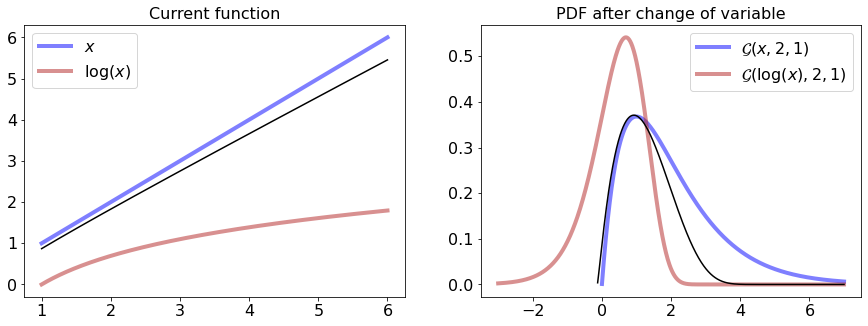

1.1400072


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


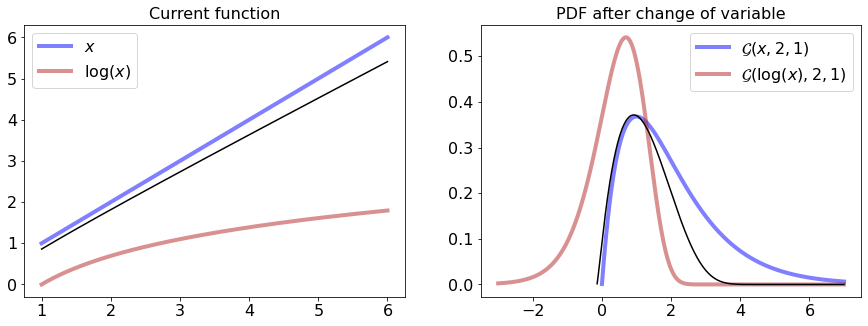

1.150007


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


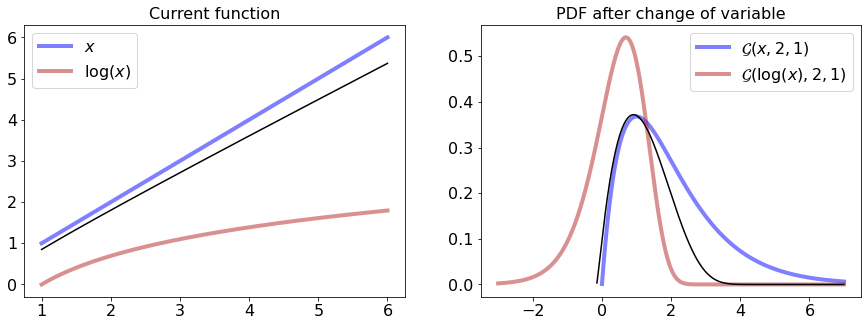

1.1600068000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


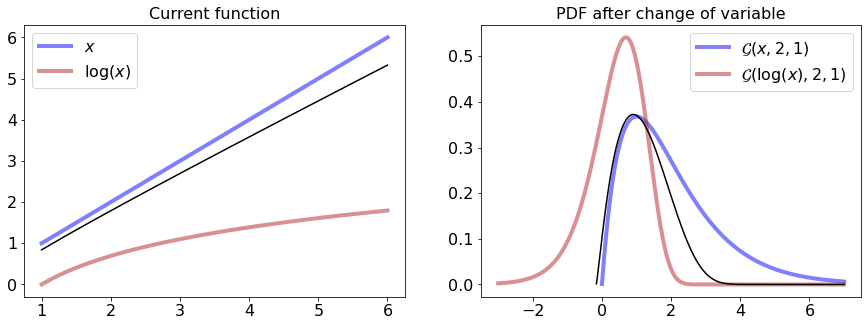

1.1700066


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


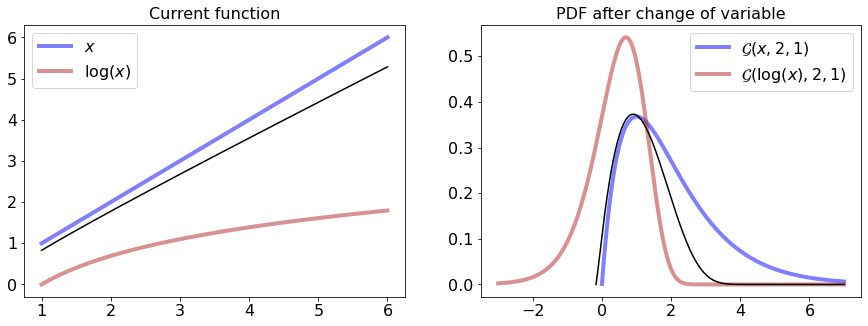

1.1800064000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


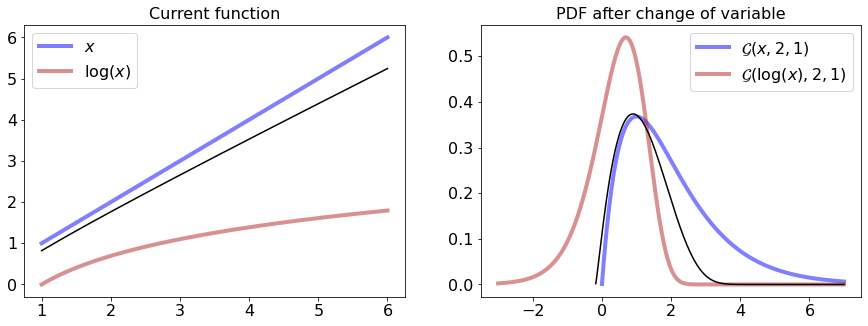

1.1900062


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


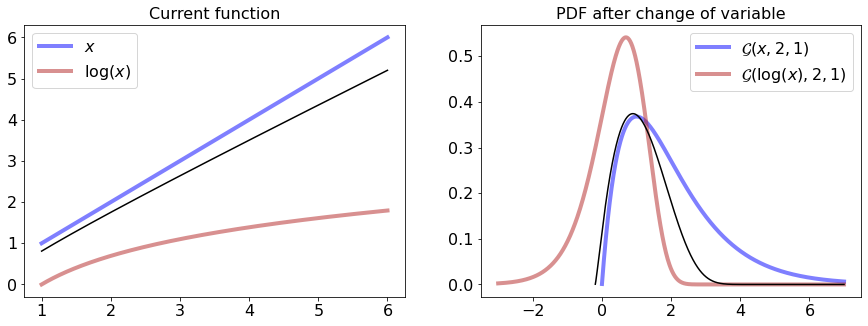

1.2000060000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


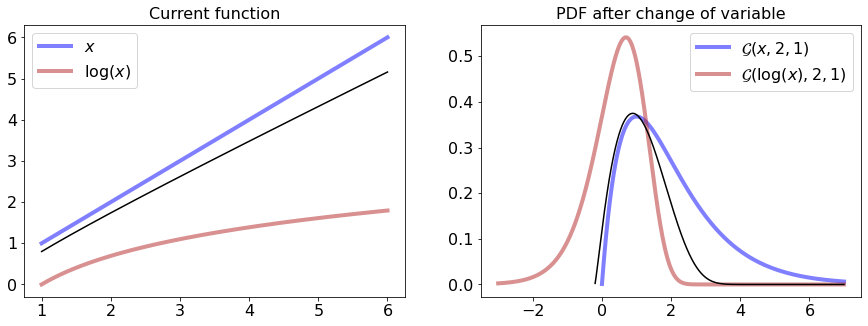

1.2100058


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


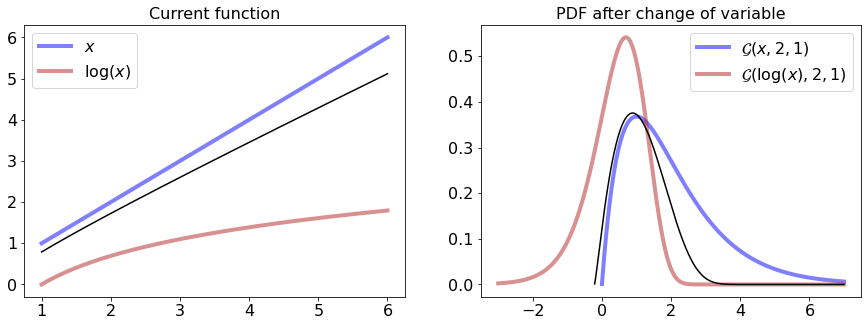

1.2200056000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


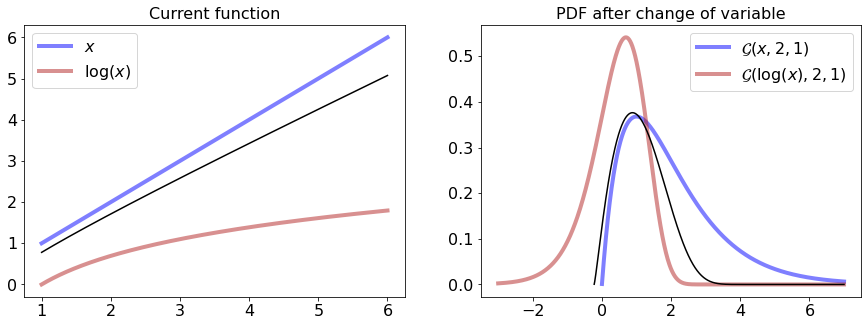

1.2300054


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


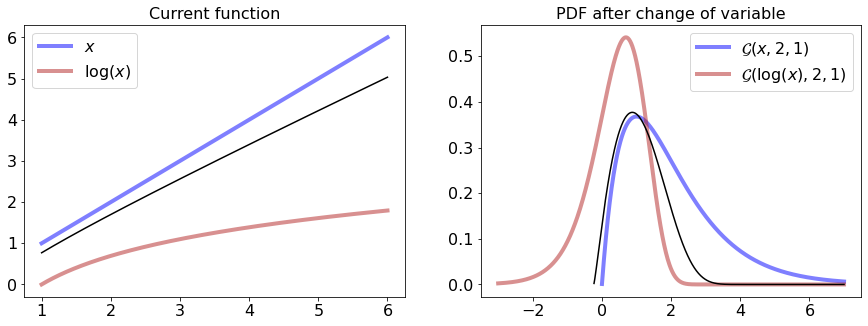

1.2400052000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


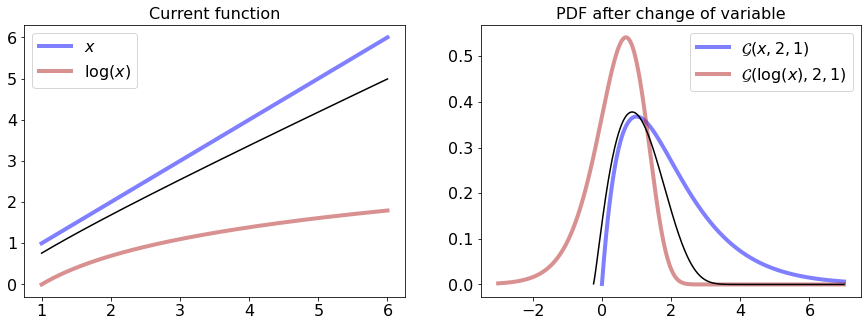

1.250005


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


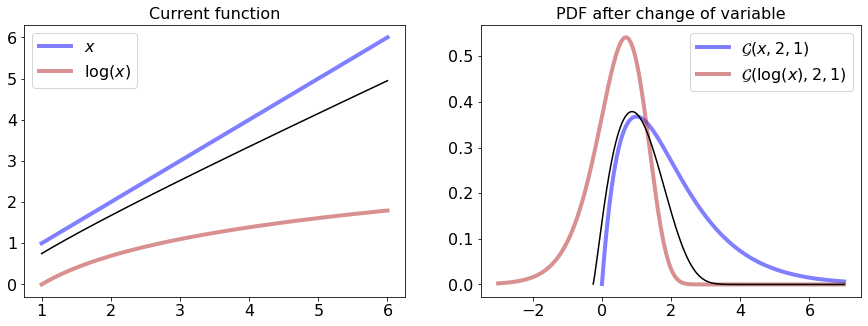

1.2600048


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


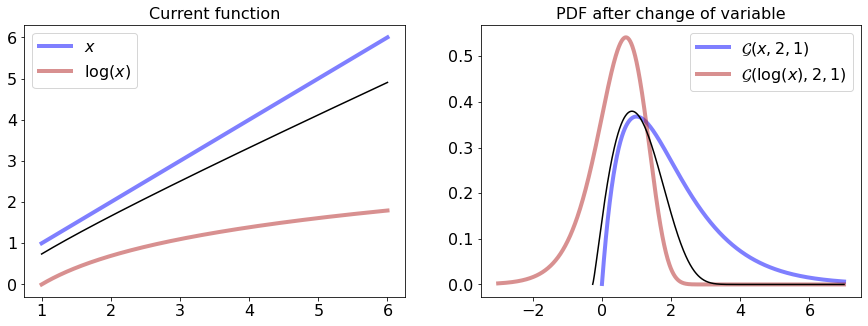

1.2700046


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


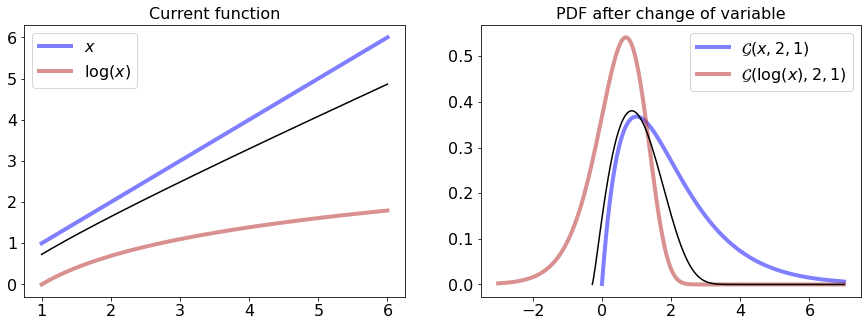

1.2800044000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


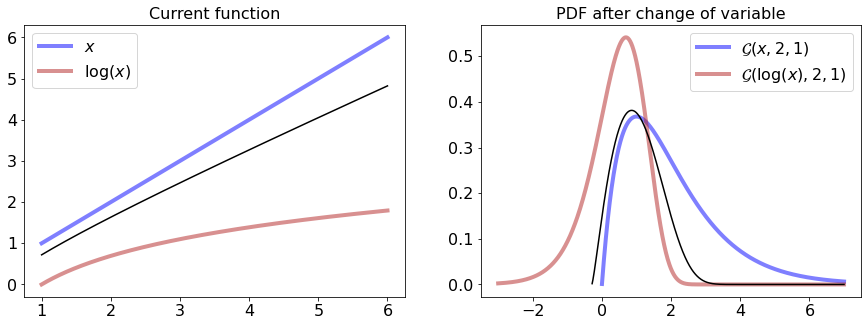

1.2900042


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


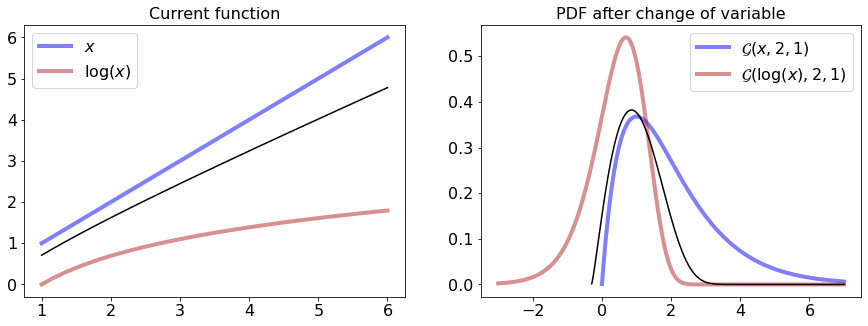

1.300004


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


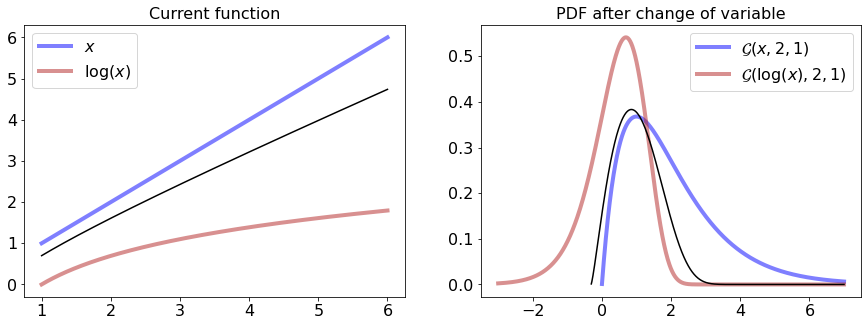

1.3100038


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


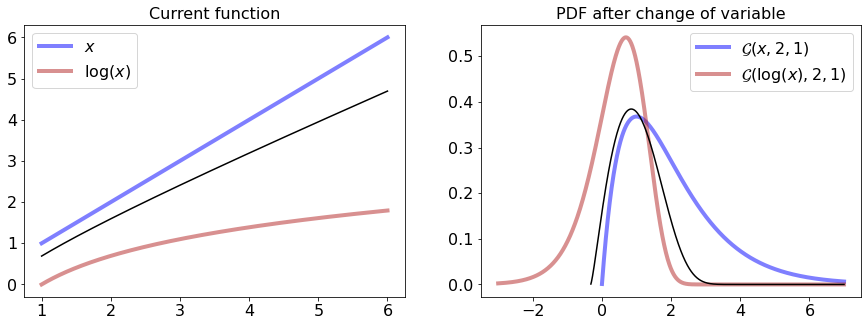

1.3200036000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


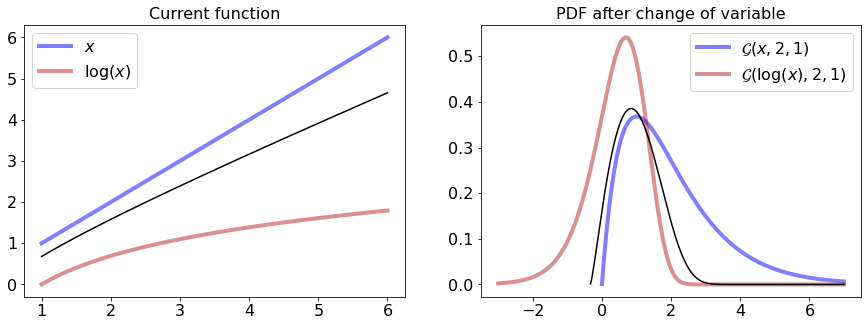

1.3300034


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


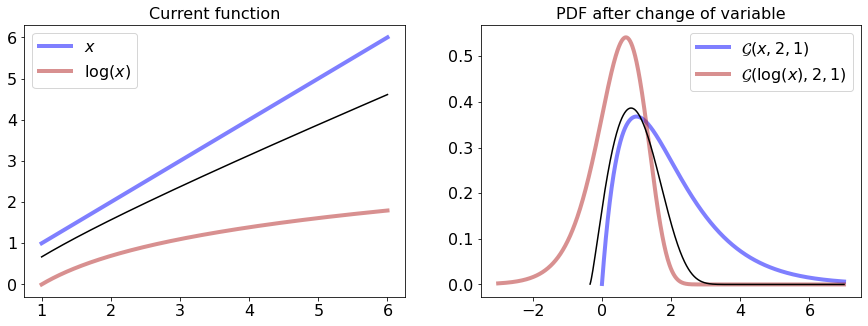

1.3400032


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


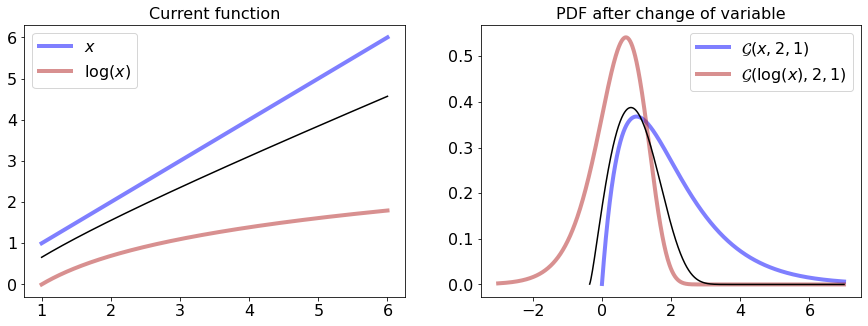

1.350003


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


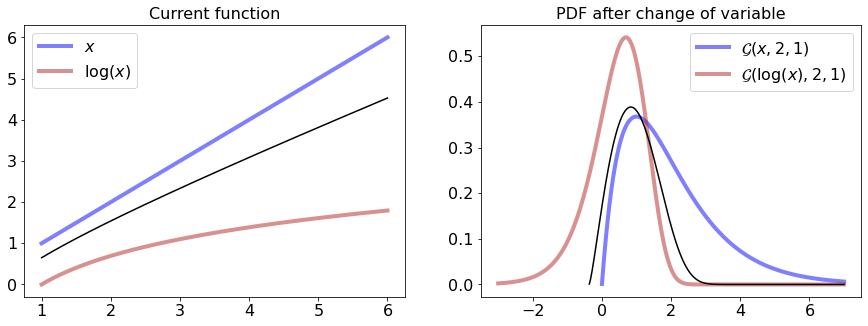

1.3600028000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


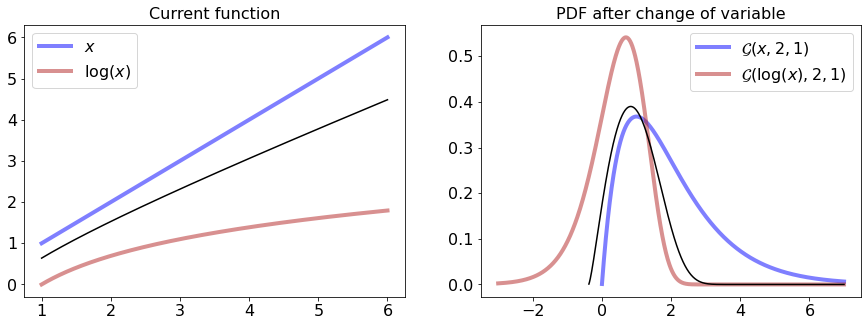

1.3700026


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


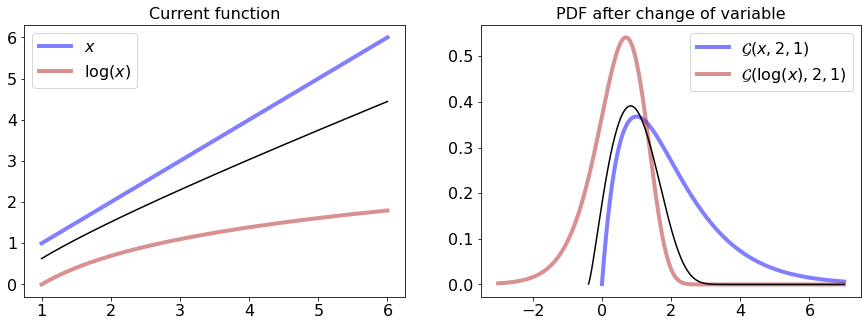

1.3800024


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


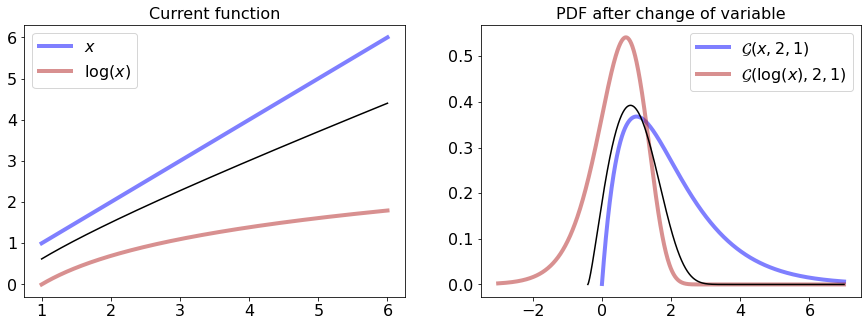

1.3900022


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


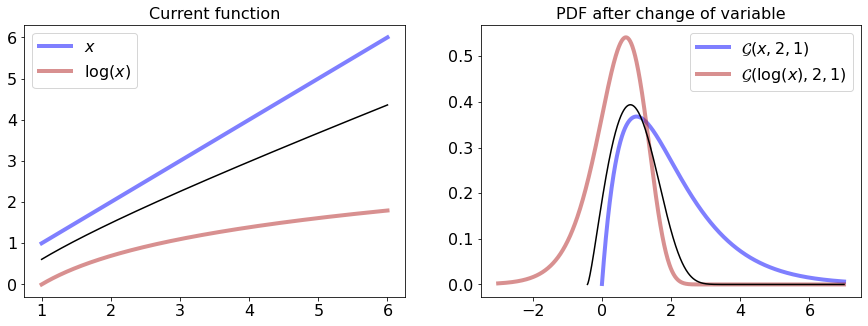

1.4000020000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


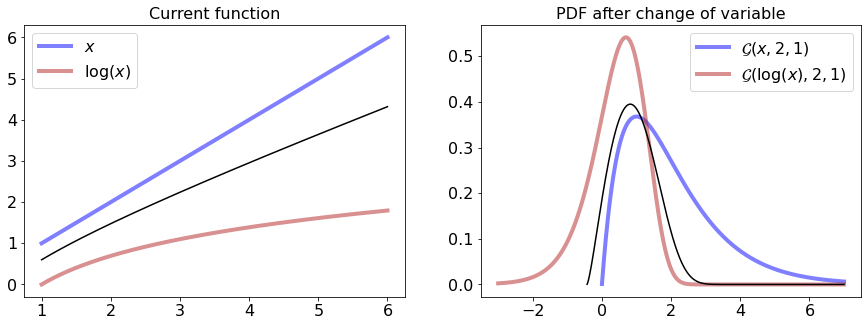

1.4100018


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


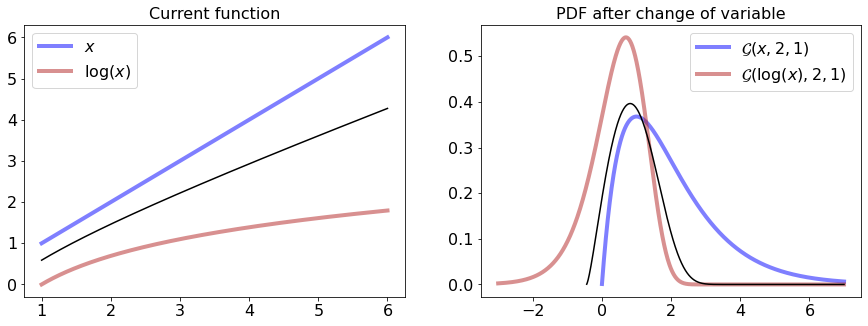

1.4200016


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


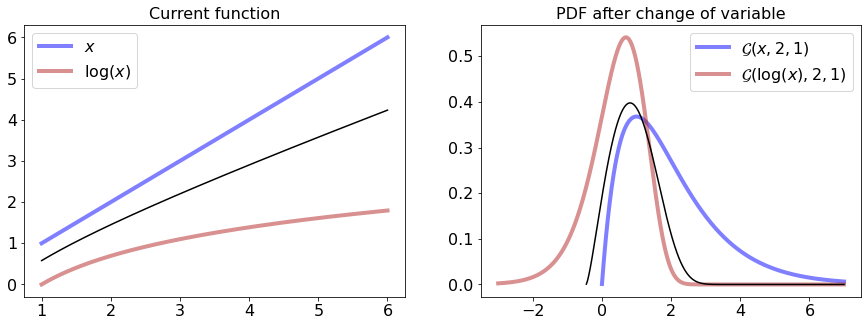

1.4300014


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


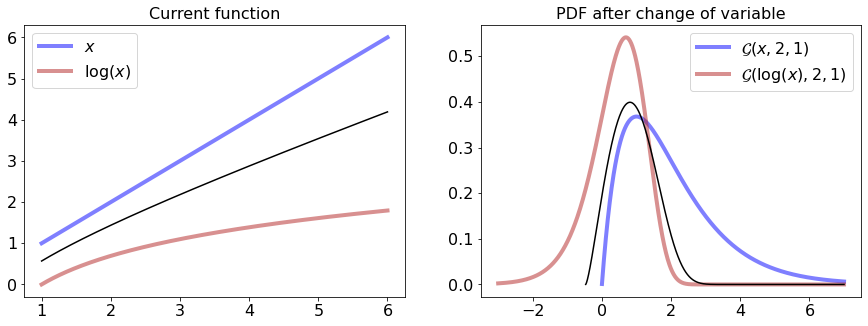

1.4400012000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


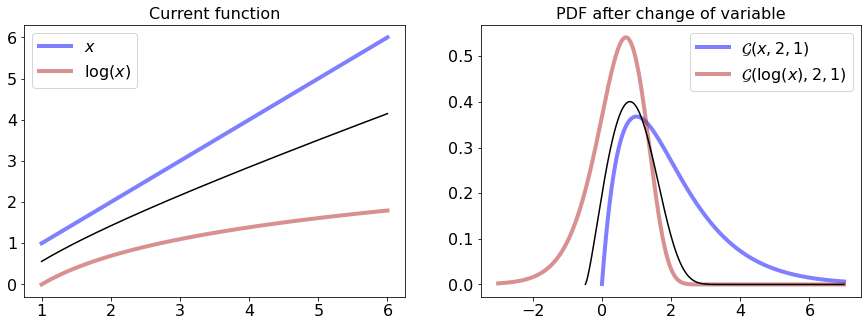

1.450001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


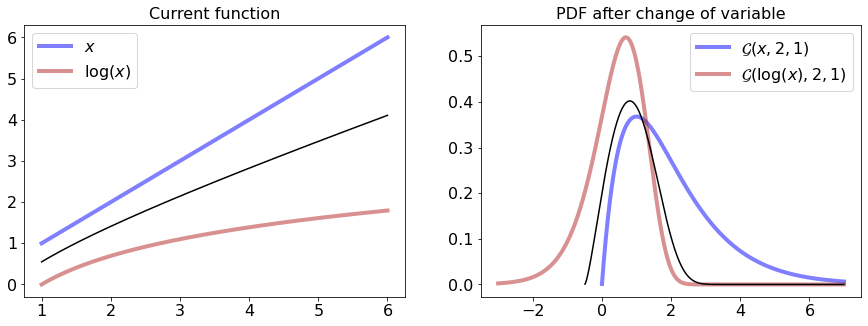

1.4600008


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


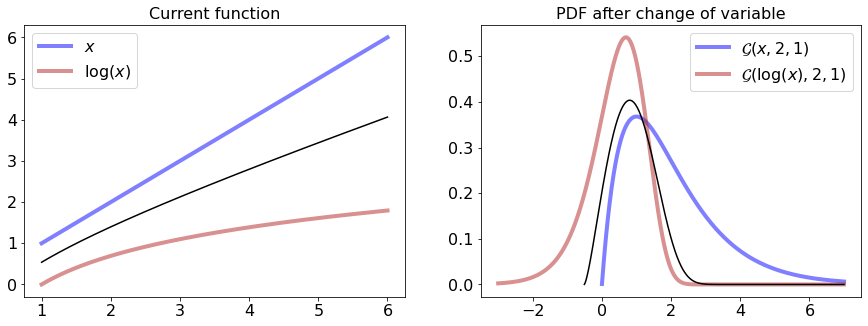

1.4700006


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


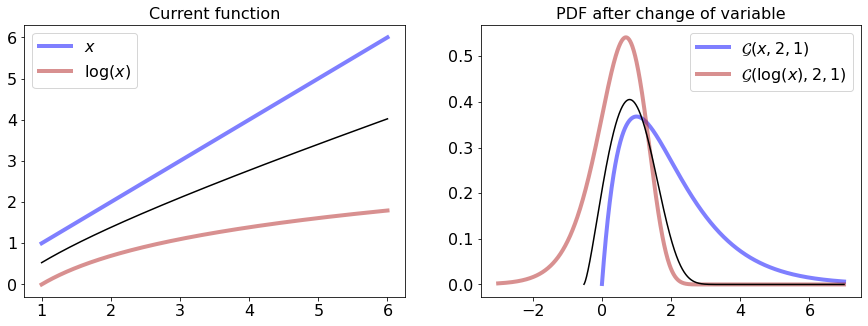

1.4800004


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


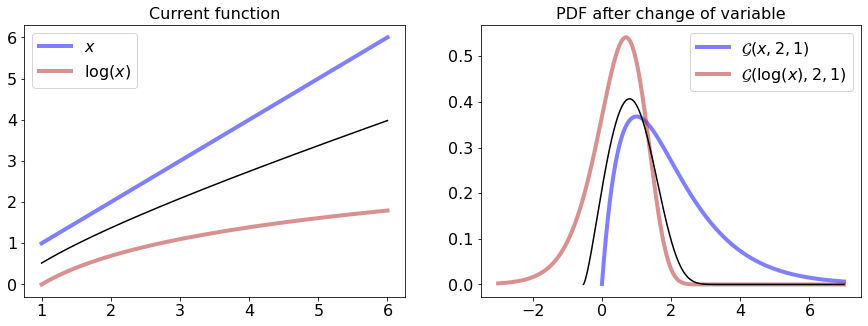

1.4900002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


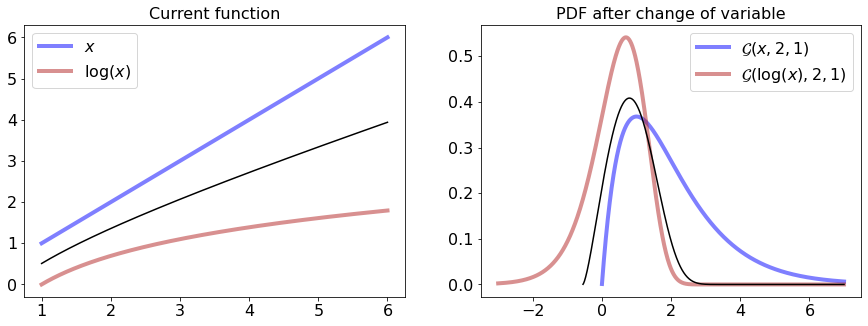

1.5


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


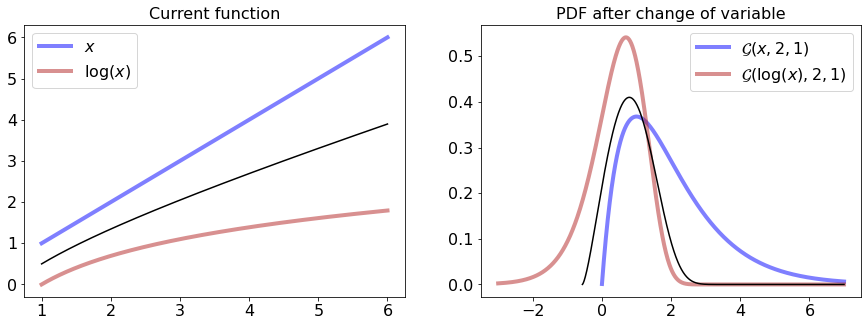

1.5099998000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


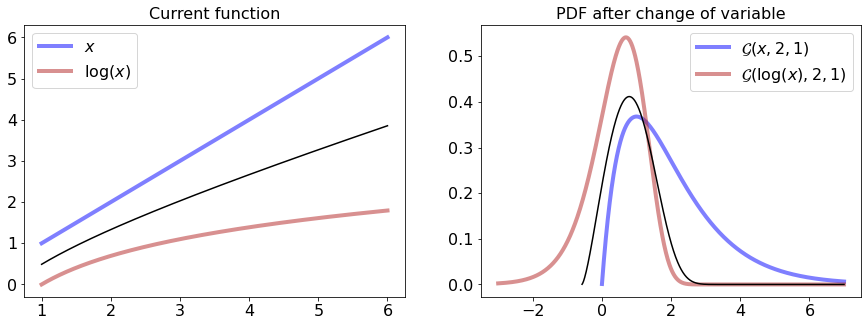

1.5199996


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


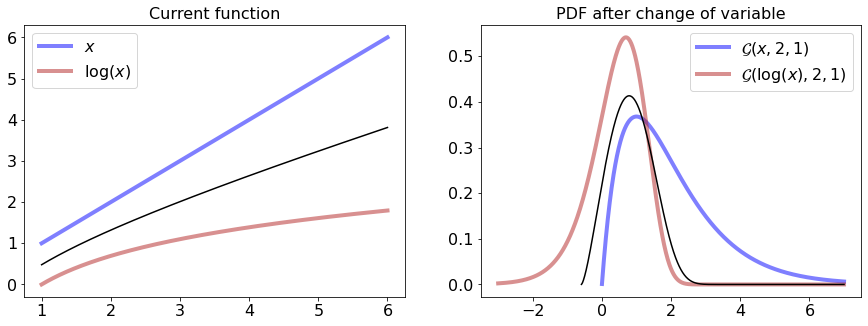

1.5299994


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


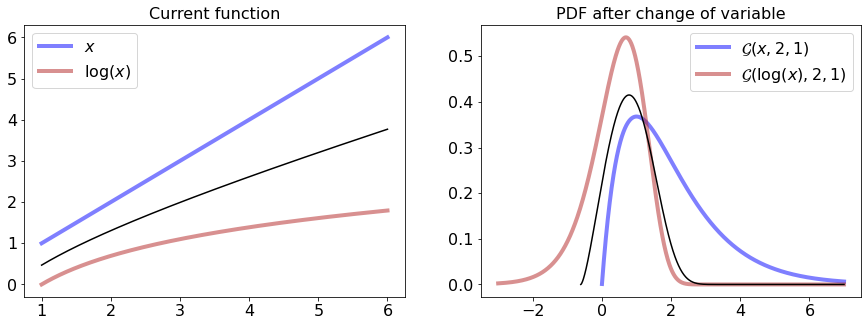

1.5399992


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


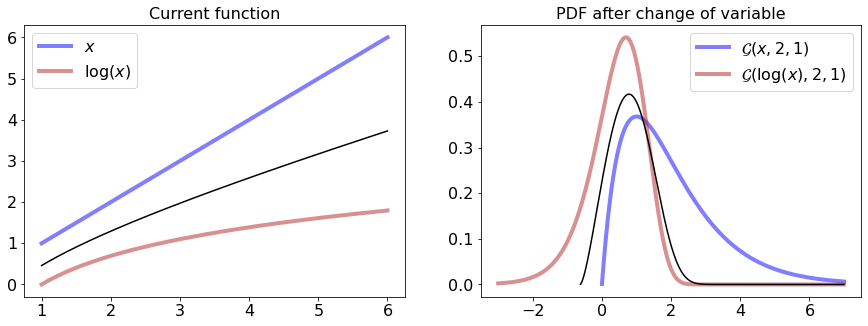

1.5499990000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


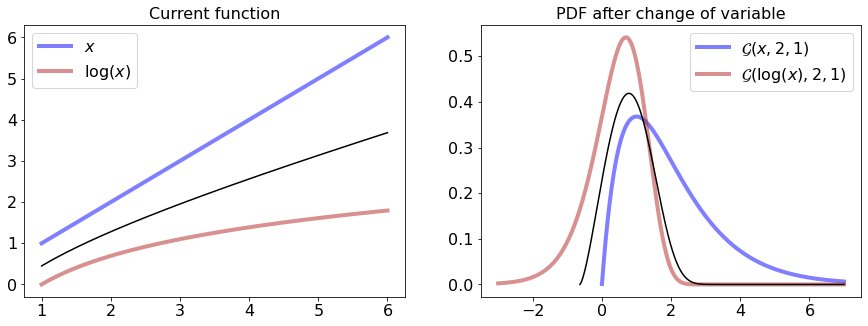

1.5599988


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


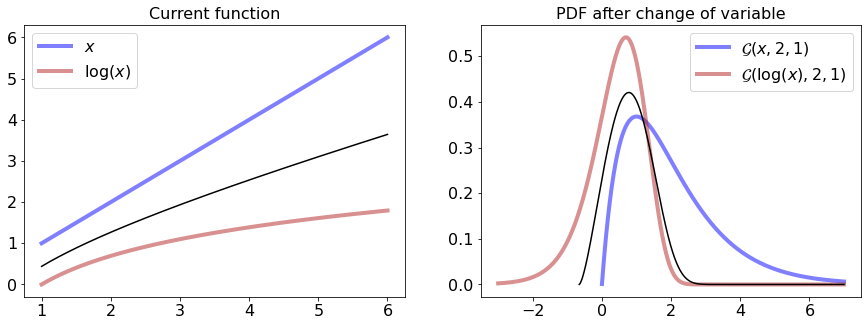

1.5699986


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


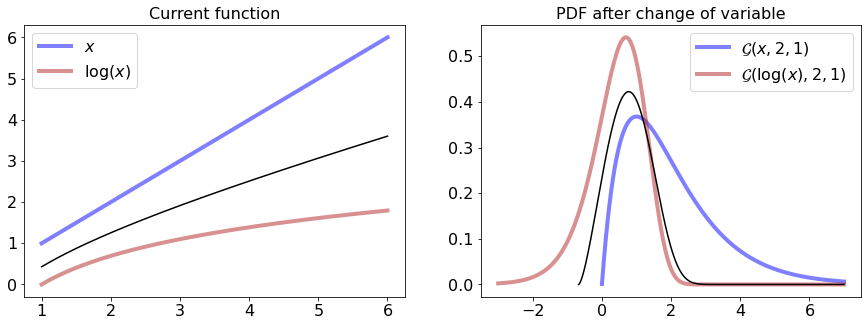

1.5799984


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


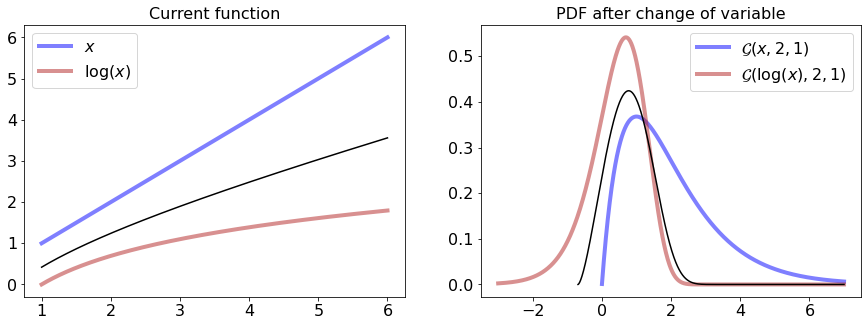

1.5899982000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


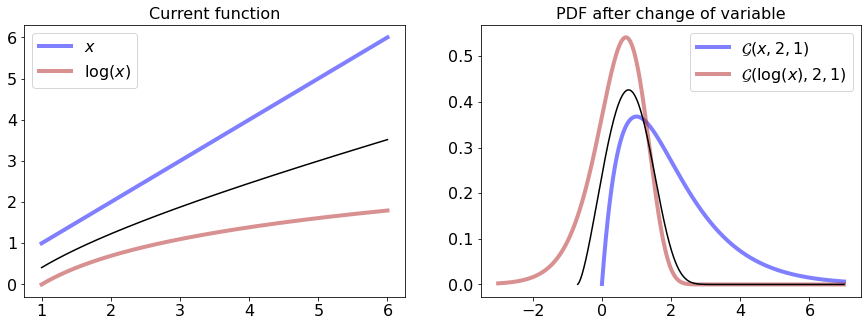

1.599998


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


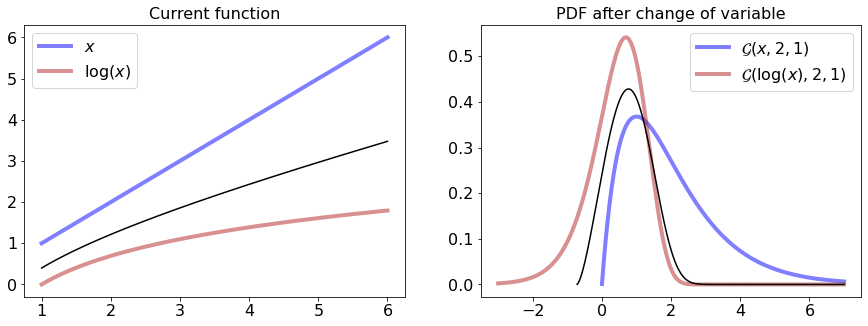

<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6099978


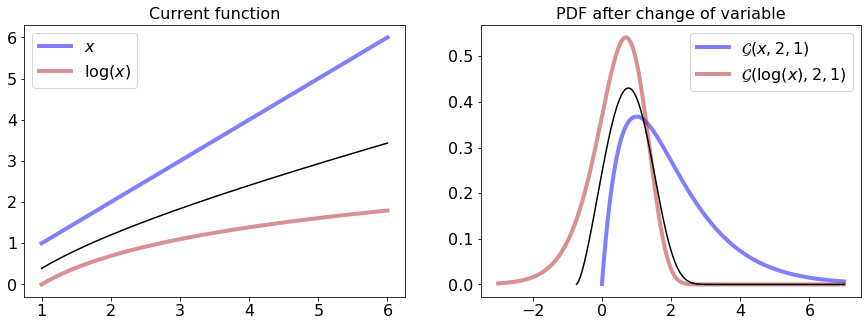

1.6199976


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


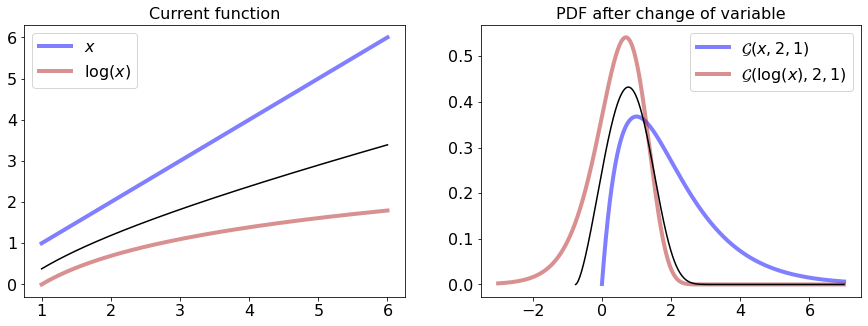

1.6299974000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


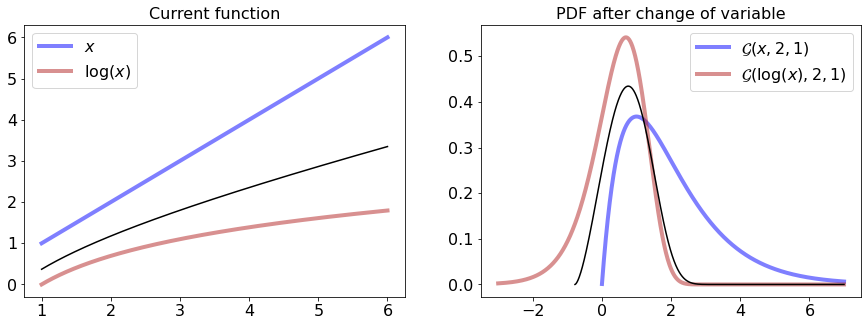

1.6399972


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


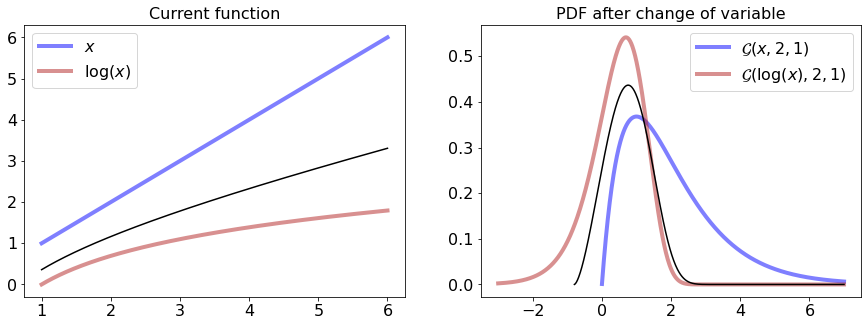

1.649997


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


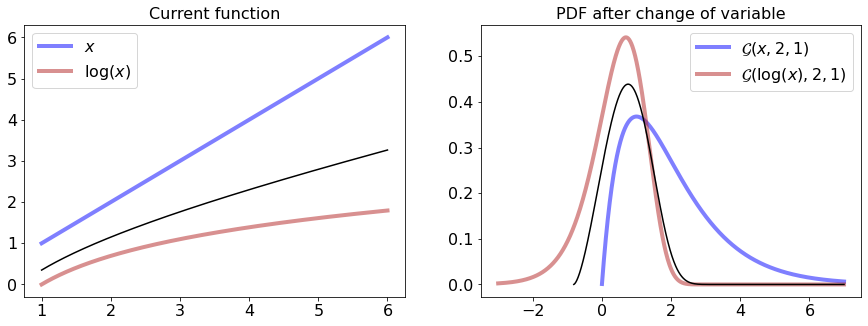

1.6599968


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


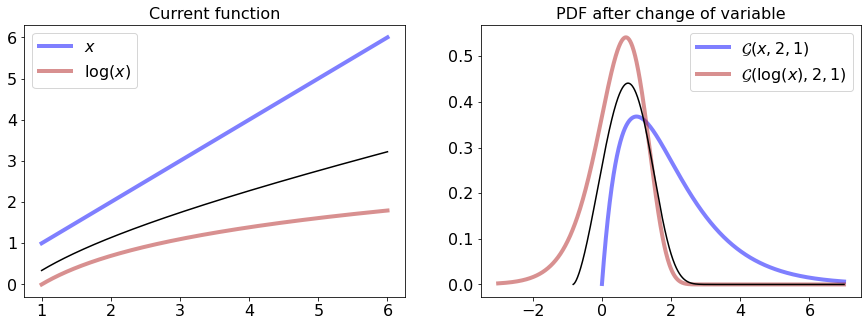

1.6699966000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


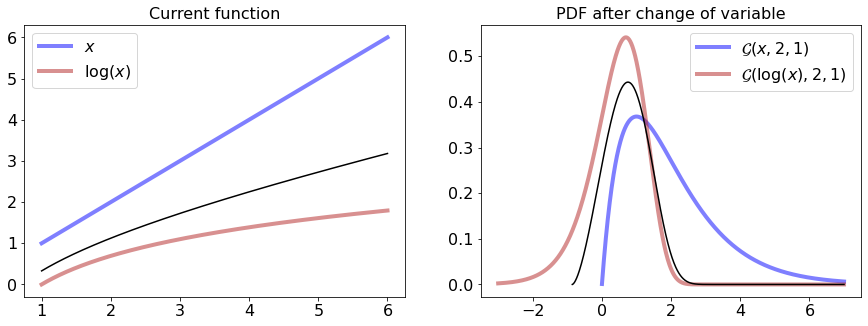

1.6799964


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


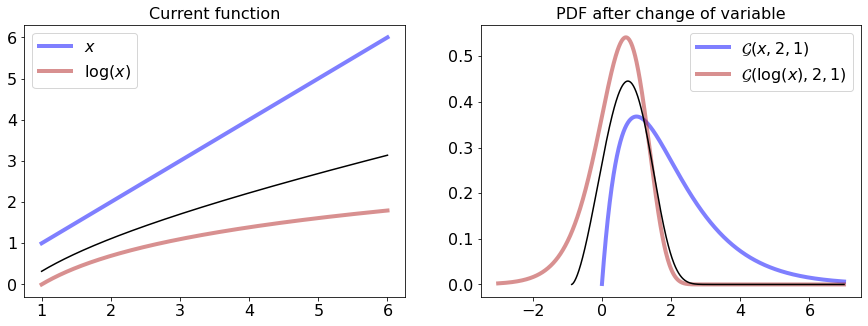

1.6899962


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


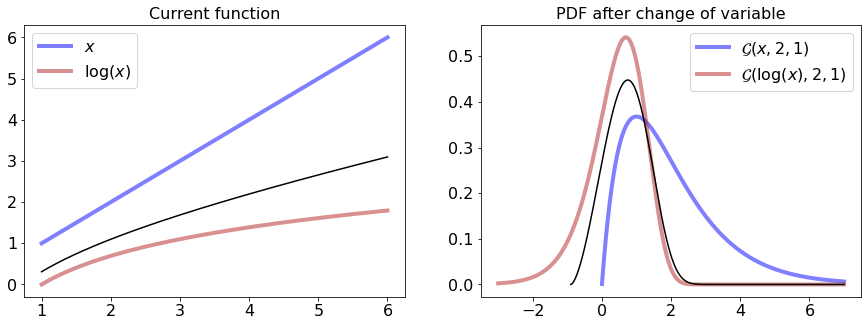

1.699996


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


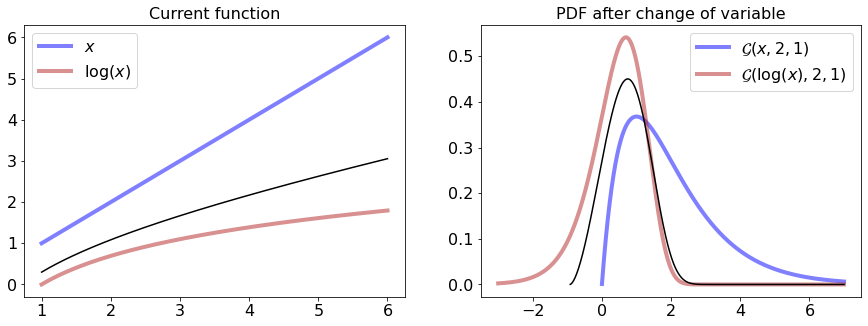

1.7099958000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


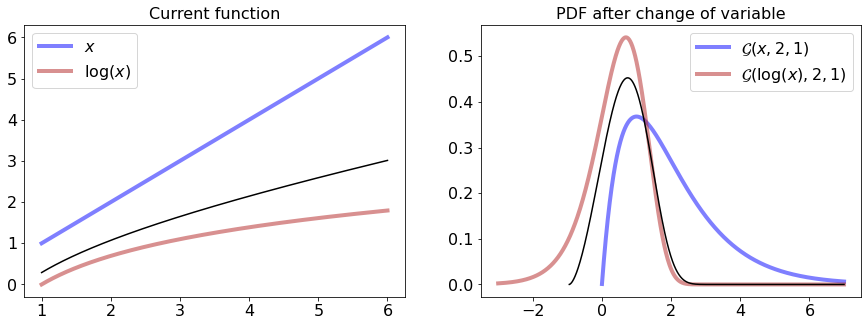

1.7199956


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


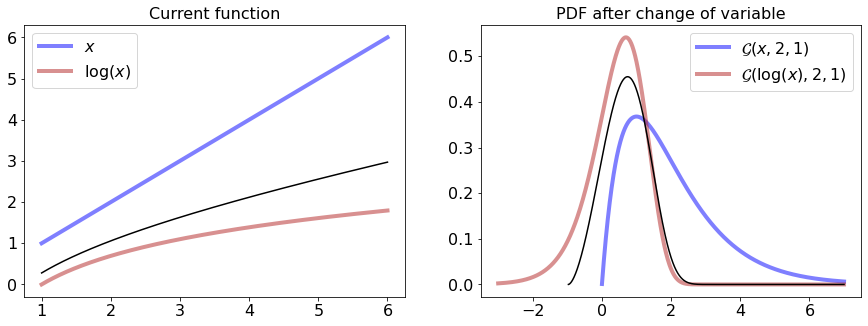

1.7299954


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


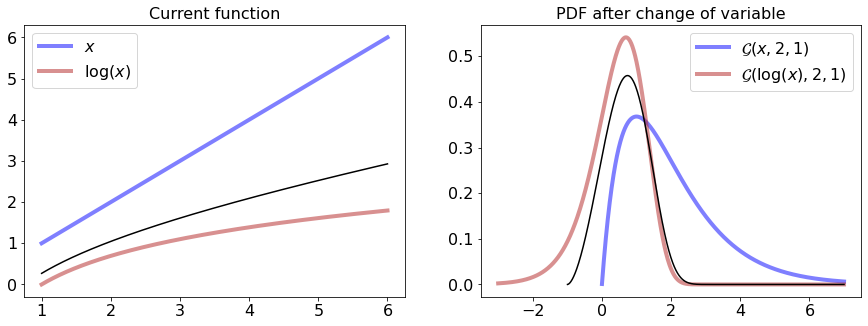

1.7399952


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


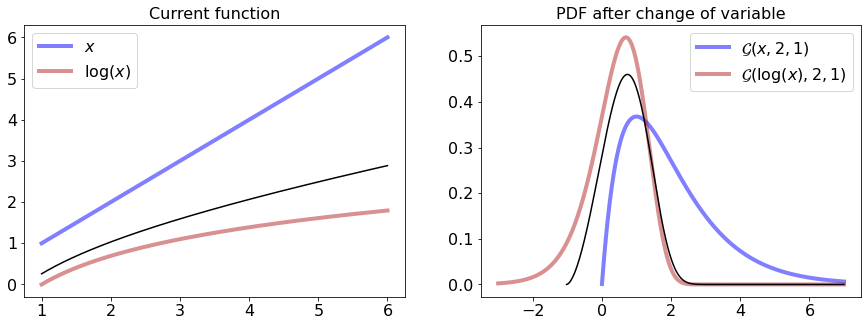

1.7499950000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


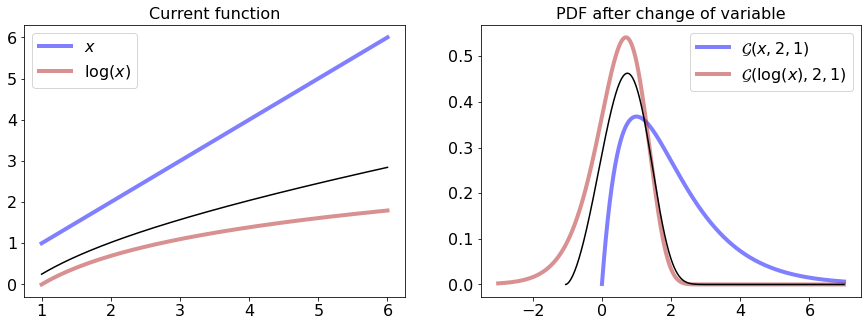

1.7599948


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


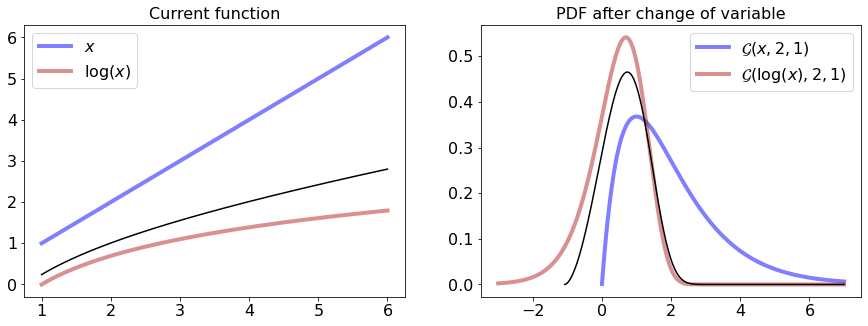

1.7699946


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


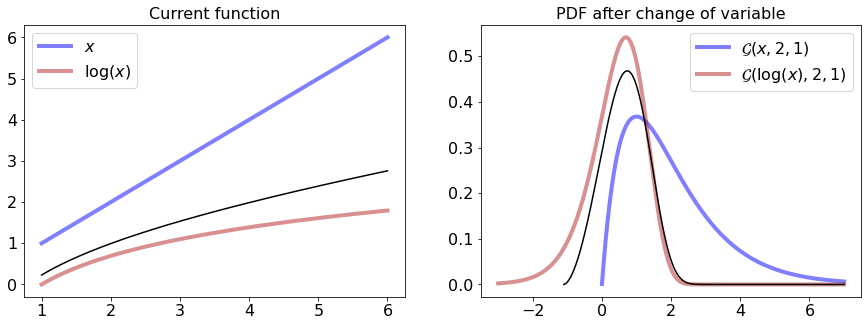

1.7799944


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


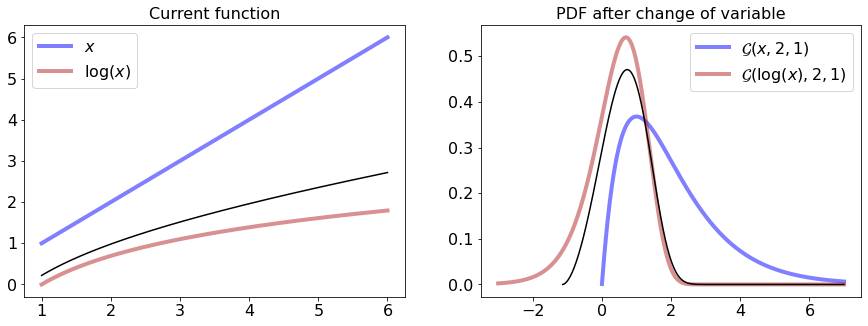

1.7899942000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


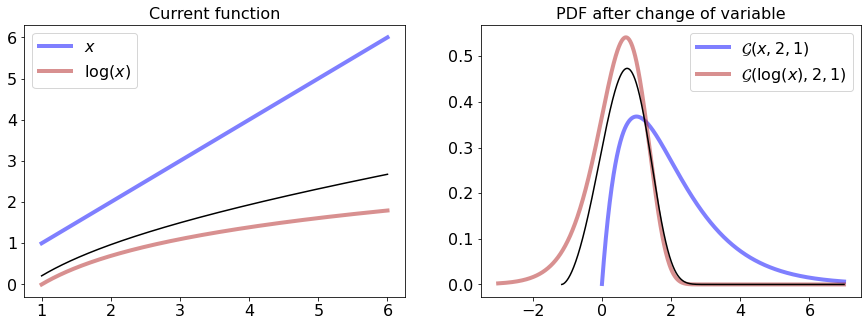

1.799994


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


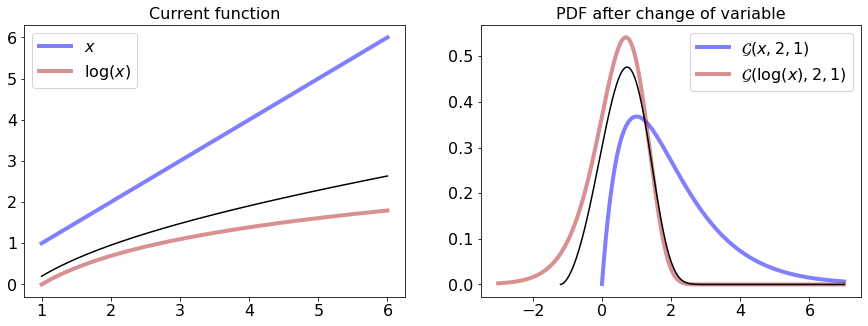

1.8099938


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


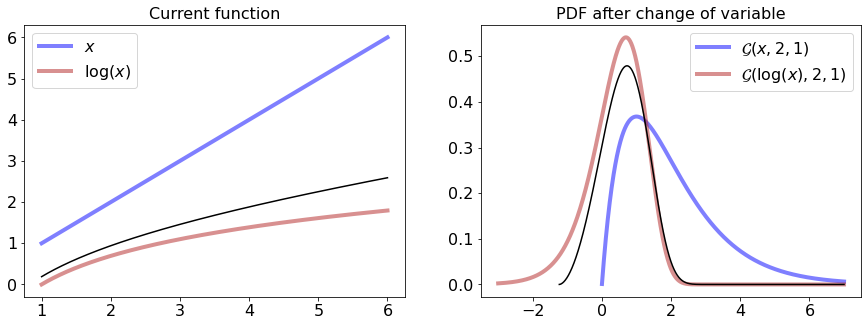

1.8199936


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


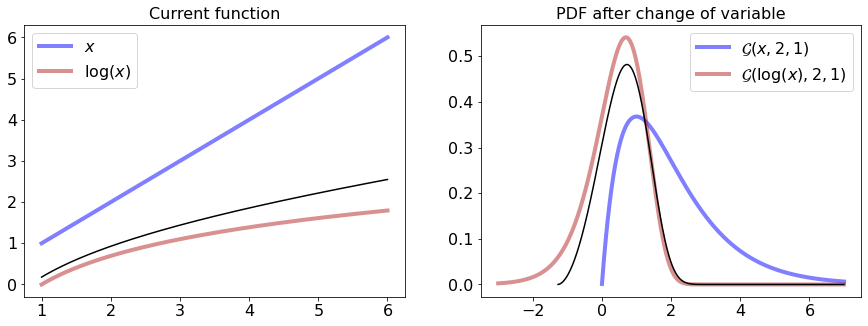

1.8299934000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


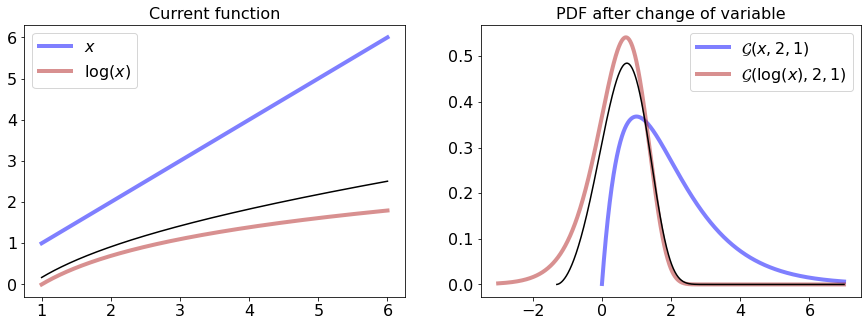

1.8399932


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


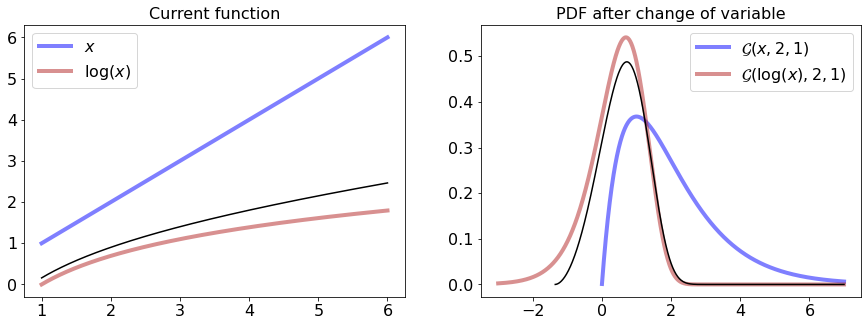

1.849993


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


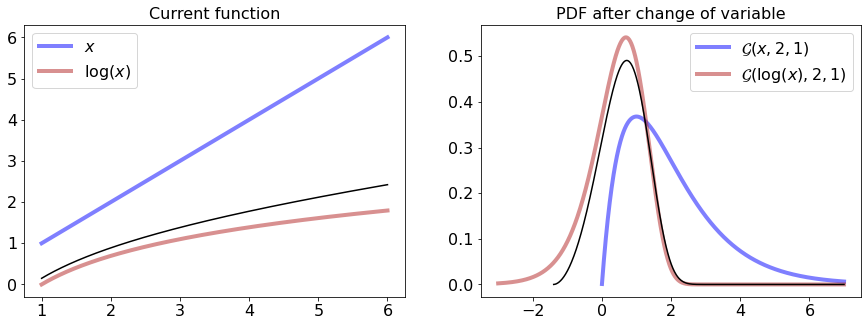

1.8599928000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


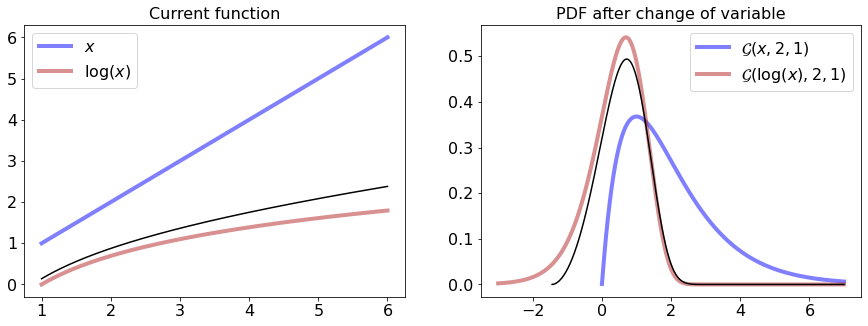

1.8699926000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


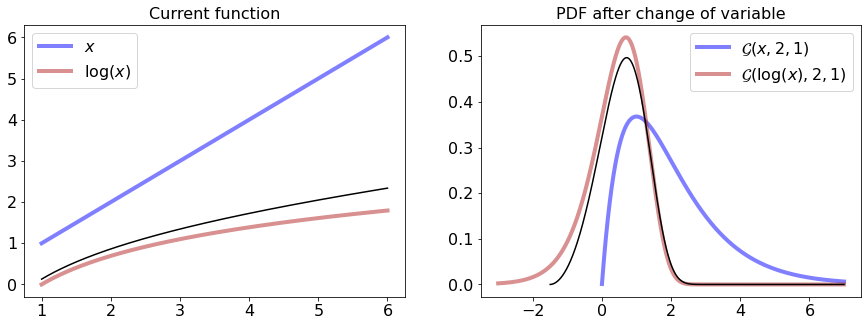

1.8799924000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


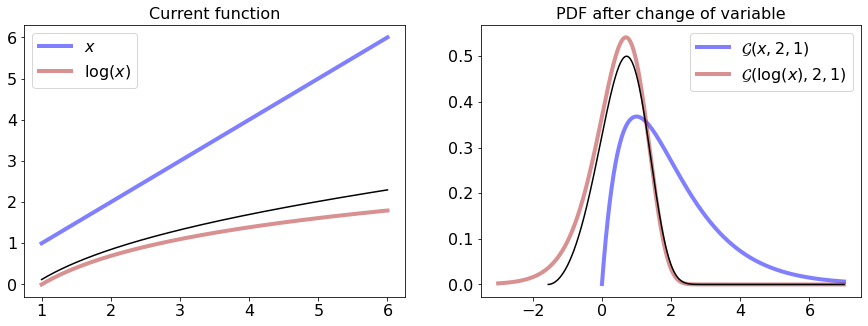

1.8899922


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


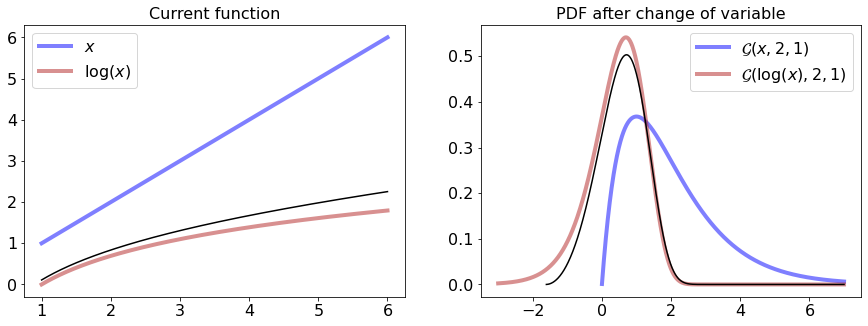

1.8999920000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


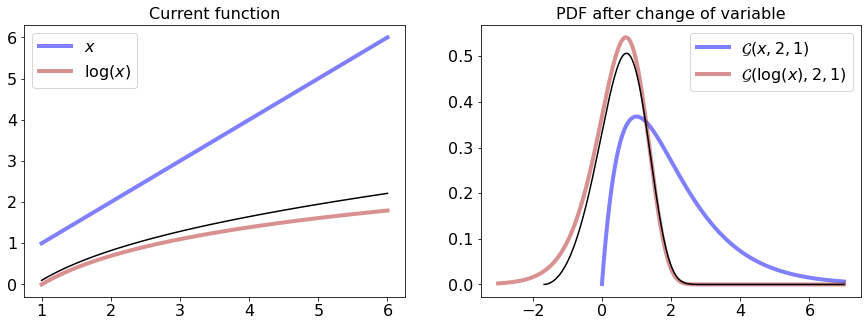

1.9099918000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


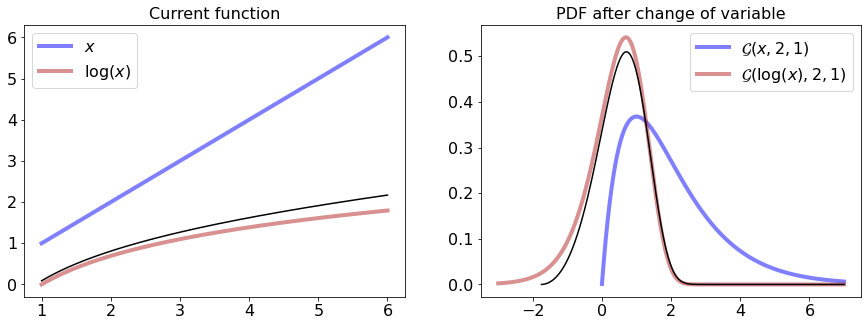

1.9199916000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


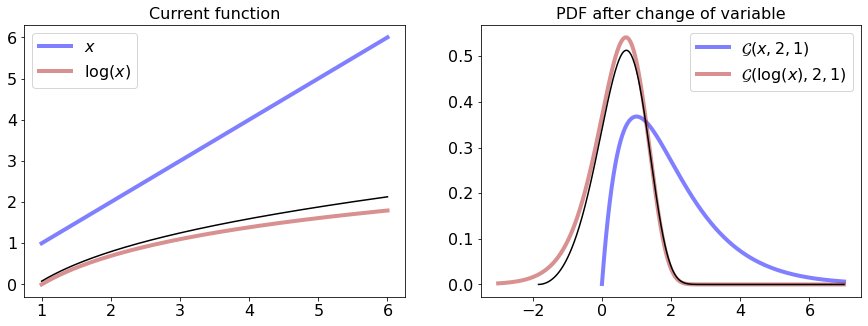

1.9299914


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


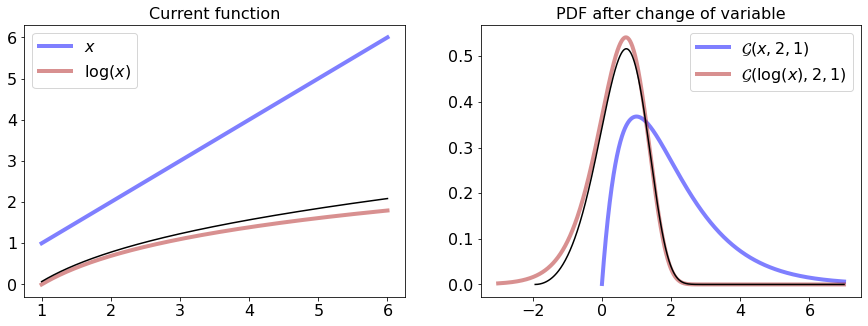

1.9399912000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


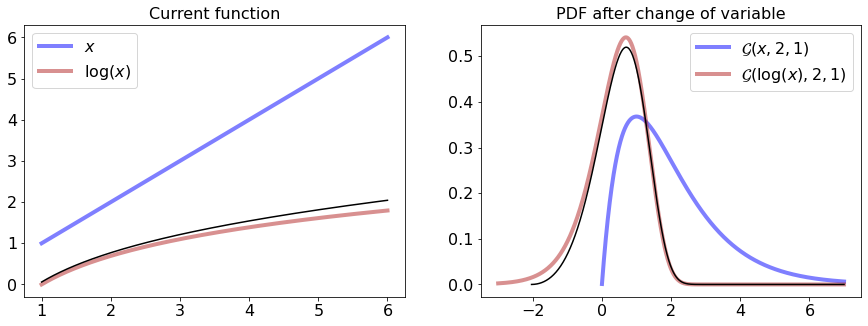

1.9499910000000003


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


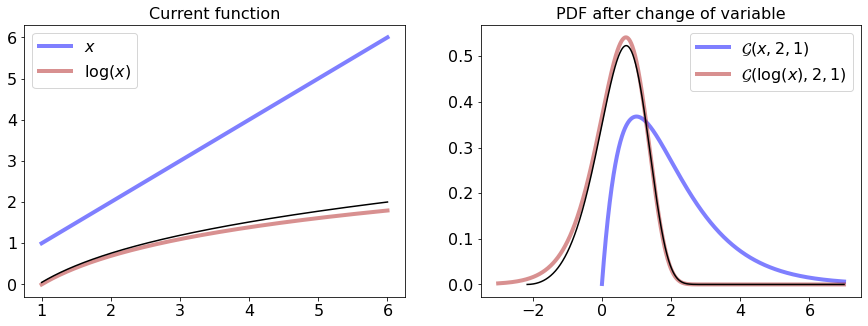

1.9599908


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


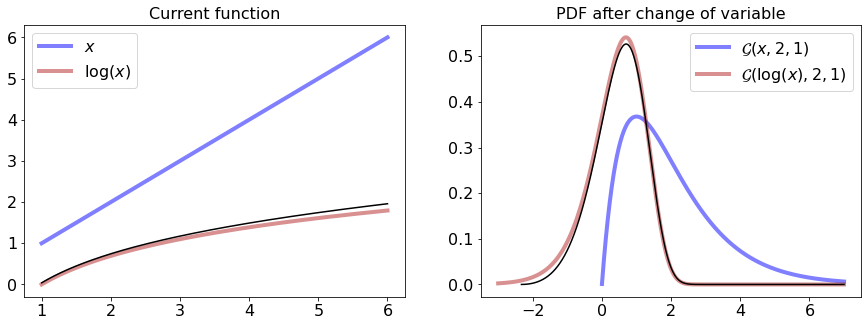

1.9699906


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


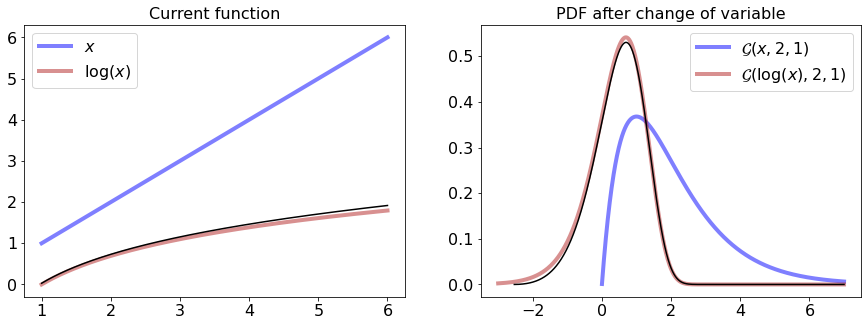

1.9799904000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


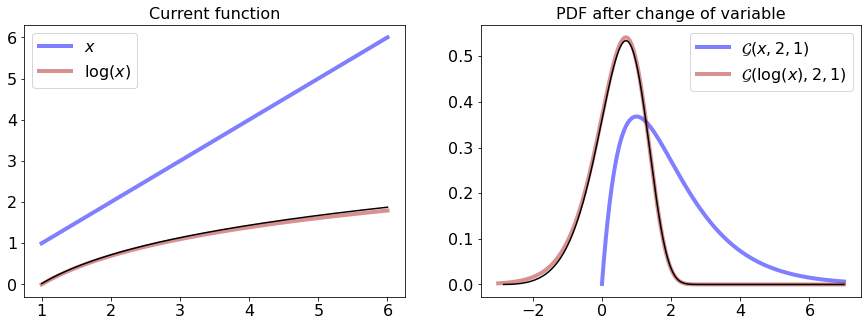

1.9899902


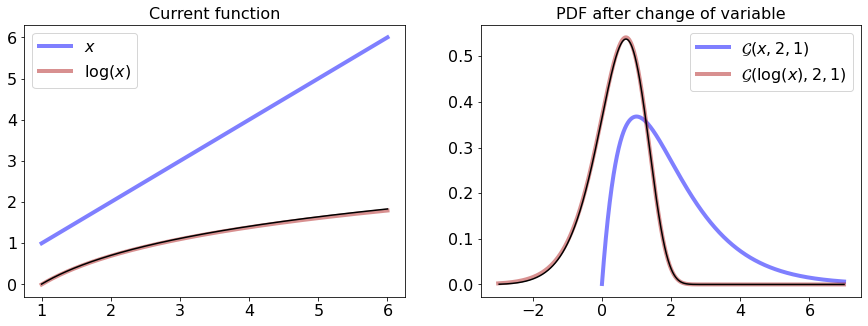

1.99999


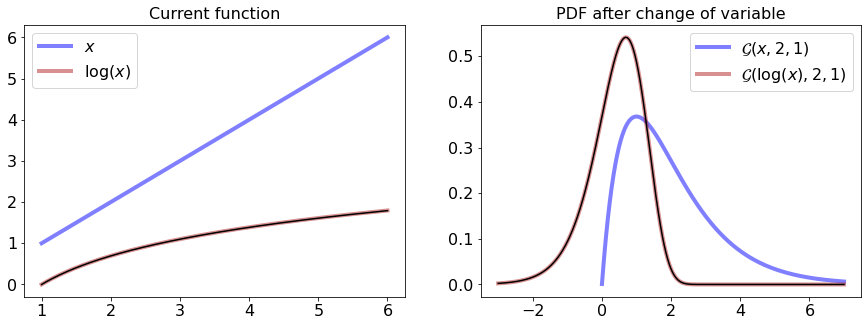

In [33]:
x_P = np.linspace(0.001, 7, 1000+1)
x_R = np.linspace(-3, 7, 1000+1)
ds = np.linspace(0.00001, 0.99999, 100+1)
x_ = np.linspace(1, 6, 1000+1)

gamma1_pdf = gamma_pdf(x_P, a1, l1)
gamma1_pdf_log = gamma_pdf_t_log(x_R, a1, l1)


plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
legend_size=16
title_size=16

for d_ in ds:
    
    #compute
    y_a1 = interpolating_log(x_, a=(1-d_))
    y_a1_max = interpolating_log(x_, a=0.001)
    y_a1_min = interpolating_log(x_, a=1)


    lb = d_ * -3
    x_Rd = np.linspace(lb, 7, 1000+1)
    gamma1_pdf_log_d = gamma_pdf_interpolating_log(x_Rd, a1, l1, d=d_)
    
    #plot
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    
    ax[0].plot(x_, y_a1_min, lw=4, alpha=0.5, color='blue', label='$x$')
    ax[0].plot(x_, y_a1_max, lw=4, alpha=0.5, color='firebrick', label='$\log(x)$')
    ax[0].plot(x_, y_a1, color='black')
    ax[0].set_title('Current function', size=title_size)
    ax[0].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].plot(x_P, gamma1_pdf, lw=4, alpha=0.5, color='blue', label='$\mathcal{G}(x, 2,1)$')
    ax[1].plot(x_R, gamma1_pdf_log, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{G}(\log(x), 2,1)$')
    ax[1].plot(x_Rd, gamma1_pdf_log_d, color='black')
    ax[1].set_title('PDF after change of variable', size=title_size)
    ax[1].legend(loc='upper right', prop={'size': legend_size})
    
    plt.show();

In [31]:
#plot
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.close()

plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
legend_size=16
title_size=16

def animate_func(i):
    
    d_ = ds[i]
    #compute
    y_a1 = interpolating_log(x_, a=(1-d_))
    y_a1_max = interpolating_log(x_, a=0.001)
    y_a1_min = interpolating_log(x_, a=1)

    lb = d_ * -3
    x_Rd = np.linspace(lb, 7, 1000+1)
    gamma1_pdf_log_d = gamma_pdf_interpolating_log(x_Rd, a1, l1, d=d_)
    
    ax[0].cla()
    ax[1].cla()
    
    #plot
    ax[0].plot(x_, y_a1_min, lw=4, alpha=0.5, color='blue', label='$x$')
    ax[0].plot(x_, y_a1_max, lw=4, alpha=0.5, color='firebrick', label='$\log(x)$')
    ax[0].plot(x_, y_a1, color='black')
    ax[0].set_title('Current function', size=title_size)
    ax[0].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].plot(x_P, gamma1_pdf, lw=4, alpha=0.5, color='blue', label='$\mathcal{G}(x, 2,1)$')
    ax[1].plot(x_R, gamma1_pdf_log, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{G}(\log(x), 2,1)$')
    ax[1].plot(x_Rd, gamma1_pdf_log_d, color='black')
    ax[1].set_title('PDF after change of variable', size=title_size)
    ax[1].legend(loc='upper right', prop={'size': legend_size})
    

In [32]:
from matplotlib import animation
from IPython.display import HTML

total_frames=100

# Animation setup
anim = animation.FuncAnimation(
    fig, func=animate_func, frames=total_frames, interval=100, blit=False
)
anim.save('Gamma_log_basis_change.gif', dpi=300)
HTML(anim.to_jshtml())

1.00001
1.00001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0100098
1.0200096


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0300094
1.0400092


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.050009
1.0600088


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0700086
1.0800084


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0900082
1.100008


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1100078
1.1200076


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1300074
1.1400072


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.150007
1.1600068000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1700066
1.1800064000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1900062
1.2000060000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2100058
1.2200056000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2300054
1.2400052000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.250005
1.2600048


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2700046
1.2800044000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2900042
1.300004


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3100038
1.3200036000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3300034
1.3400032


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.350003
1.3600028000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3700026
1.3800024


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3900022
1.4000020000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4100018
1.4200016


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4300014
1.4400012000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.450001
1.4600008


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4700006


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4800004
1.4900002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5
1.5099998000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5199996
1.5299994


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5399992
1.5499990000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5599988
1.5699986


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5799984
1.5899982000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.599998
1.6099978


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6199976
1.6299974000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6399972
1.649997


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6599968
1.6699966000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6799964
1.6899962


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.699996
1.7099958000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7199956
1.7299954


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7399952
1.7499950000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7599948
1.7699946


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7799944
1.7899942000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.799994
1.8099938


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8199936
1.8299934000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8399932
1.849993


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8599928000000001
1.8699926000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8799924000000001
1.8899922


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8999920000000001
1.9099918000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9199916000000001
1.9299914


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9399912000000001
1.9499910000000003


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9599908
1.9699906


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9799904000000002
1.9899902


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.00001
1.00001
1.0100098


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0200096
1.0300094


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0400092
1.050009


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0600088
1.0700086


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.0800084
1.0900082


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.100008
1.1100078


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1200076
1.1300074


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1400072
1.150007


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1600068000000001
1.1700066


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.1800064000000001
1.1900062


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2000060000000001
1.2100058


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2200056000000001
1.2300054


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2400052000000001
1.250005


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2600048
1.2700046


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.2800044000000002
1.2900042


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.300004
1.3100038


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3200036000000002
1.3300034


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3400032
1.350003


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3600028000000002
1.3700026


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.3800024
1.3900022


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4000020000000002
1.4100018


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4200016
1.4300014


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4400012000000002
1.450001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4600008
1.4700006


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.4800004
1.4900002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5
1.5099998000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5199996
1.5299994


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5399992
1.5499990000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5599988
1.5699986


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.5799984
1.5899982000000001


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.599998
1.6099978


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6199976
1.6299974000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6399972
1.649997


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6599968
1.6699966000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.6799964
1.6899962


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.699996
1.7099958000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7199956
1.7299954


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7399952
1.7499950000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.7599948
1.7699946
1.7799944
1.7899942000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.799994
1.8099938


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8199936
1.8299934000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8399932
1.849993


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8599928000000001
1.8699926000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8799924000000001
1.8899922


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.8999920000000001
1.9099918000000002


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9199916000000001
1.9299914


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9399912000000001
1.9499910000000003


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9599908
1.9699906


<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-18-67cd0435eb2a>:17: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


1.9799904000000002
1.9899902
